In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../python')
from functions import *
from models import *
from tqdm import *
import os

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import corner

from sklearn.preprocessing import StandardScaler




# Set up some parameters for pretty plots
plt.rcParams.update({
    'figure.dpi': 200,
    "text.usetex": True,
    "pgf.rcfonts": False,
    "font.family": "serif",
    "font.size": 13,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 11,
    "figure.max_open_warning": False,
})


# Finding the right parameter for side-band

In [2]:
# Load calssified data
class_df = pd.read_hdf('../notebooks/test_gd1/df_test.h5')

interest_vars=['ϕ', 'λ', 'μ_ϕcosλ', 'μ_λ', 'b-r', 'g']  # all trainable params
intuitive_vars=['ϕ', 'λ']                               # Stream looks clean on those vars
toy_vars=['ϕ', 'λ', 'μ_λ']                              # Toy problem
stream_inds=class_df['stream']                          # 'Ground Truth'
nn_score_inds=class_df['nn_score']>0.7                  # 80% of NN score



# Centering around entire data

### Simplified 2D example

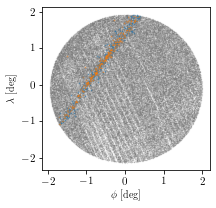

In [3]:
# Stadardaize data
scaler = StandardScaler()
standardized_design = scaler.fit_transform(class_df[intuitive_vars])

# Plot labeled vs ground truth
plt.figure(figsize=(3,3))
plt.scatter(*standardized_design.T,c='gray',alpha=0.2,s=0.03)
plt.scatter(*standardized_design[stream_inds].T,alpha=0.4,s=0.6)
plt.scatter(*standardized_design[nn_score_inds].T,alpha=0.4,s=0.6)
plt.xlabel('$\phi$ [deg]')
plt.ylabel('$\lambda$ [deg]')
plt.show()

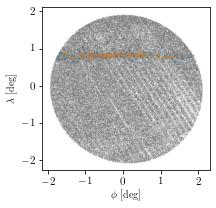

In [4]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]


plt.figure(figsize=(3,3))
plt.scatter(*sorted_eigenvectors_nn @ standardized_design.T,c='gray',alpha=0.2,s=0.03)
plt.scatter(*sorted_eigenvectors_nn @ standardized_design[stream_inds].T,alpha=0.4,s=0.6)
plt.scatter(*sorted_eigenvectors_nn @ standardized_design[nn_score_inds].T,alpha=0.4,s=0.6)
plt.xlabel('$\phi$ [deg]')
plt.ylabel('$\lambda$ [deg]')
plt.show()

### 3D Case

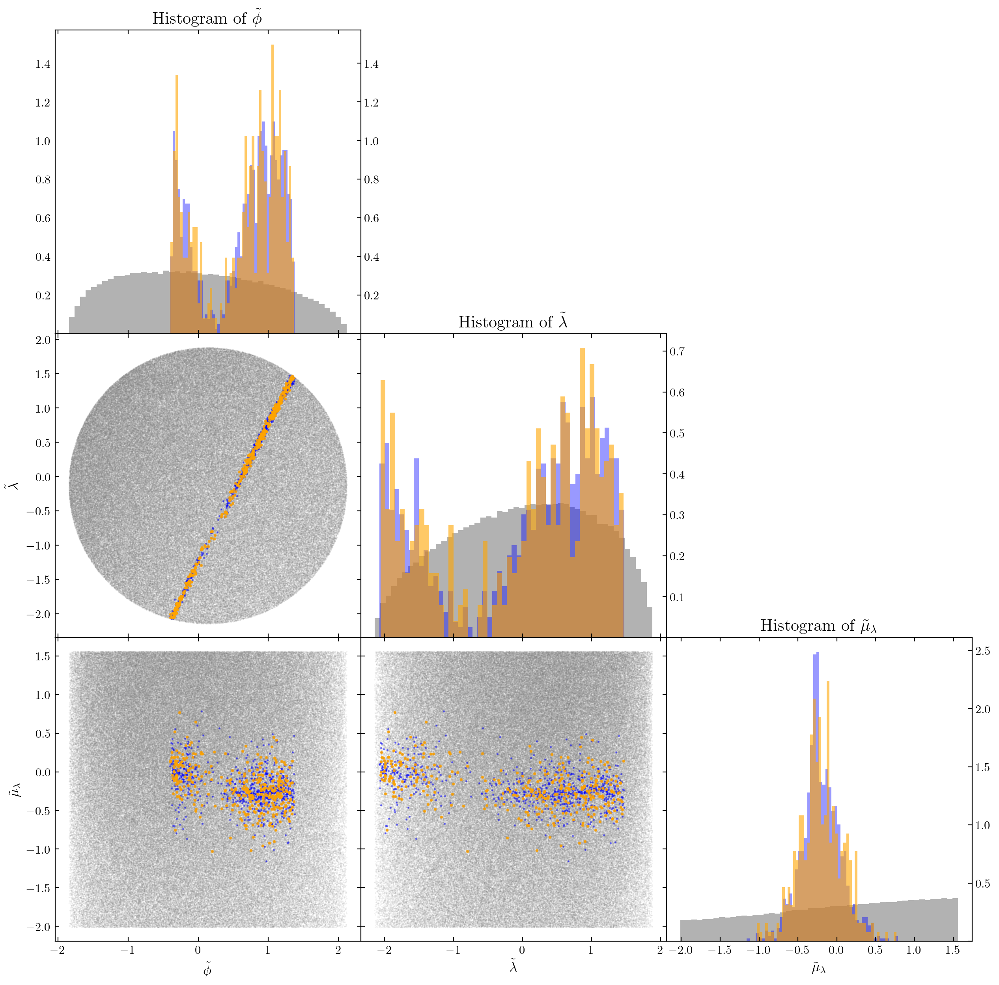

In [5]:
# Stadardaize data
scaler = StandardScaler()
standardized_design = scaler.fit_transform(class_df[toy_vars])

vars=[r'$\tilde{\phi}$', r'$\tilde{\lambda}$', r'$\tilde{\mu}_\lambda$']
corner_plots(standardized_design, vars, nn_score_inds, stream_inds)

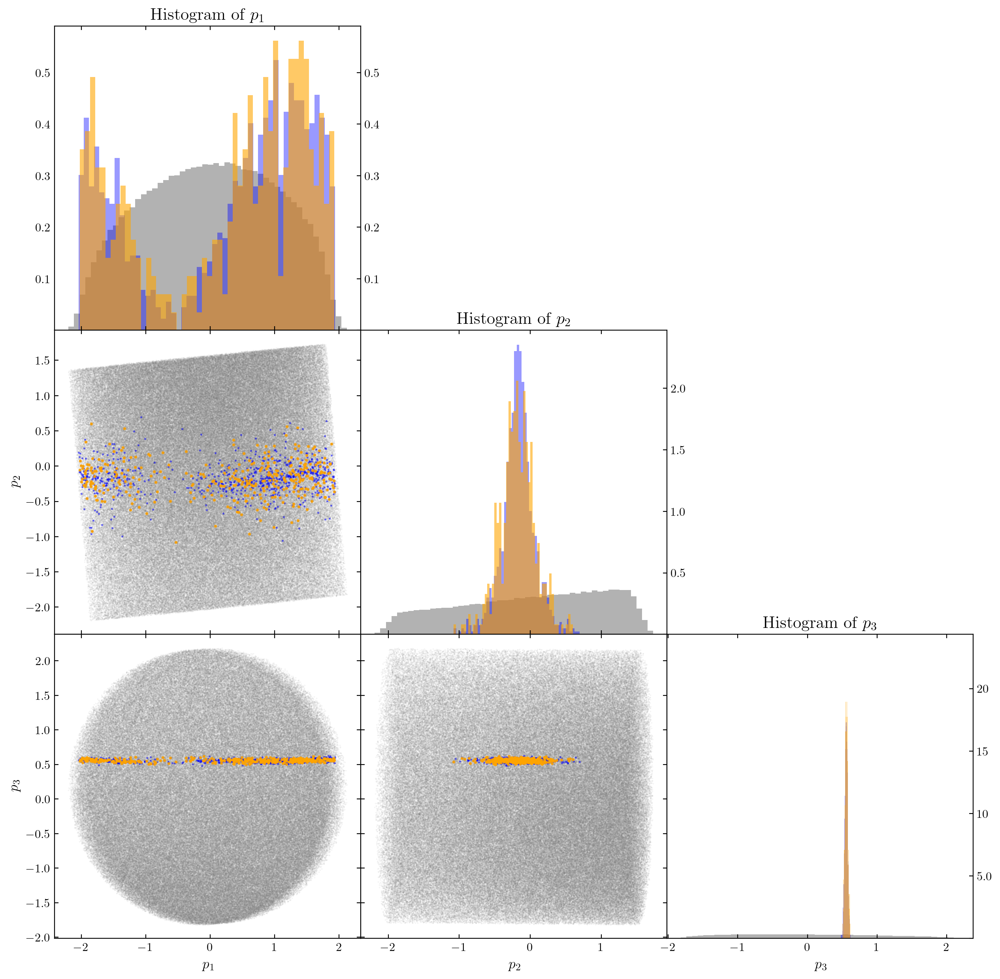

In [7]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]

vars=['$p_1$', '$p_2$', '$p_3$']
corner_plots(standardized_design @ sorted_eigenvectors_nn, vars, nn_score_inds, stream_inds)


### Full 6D

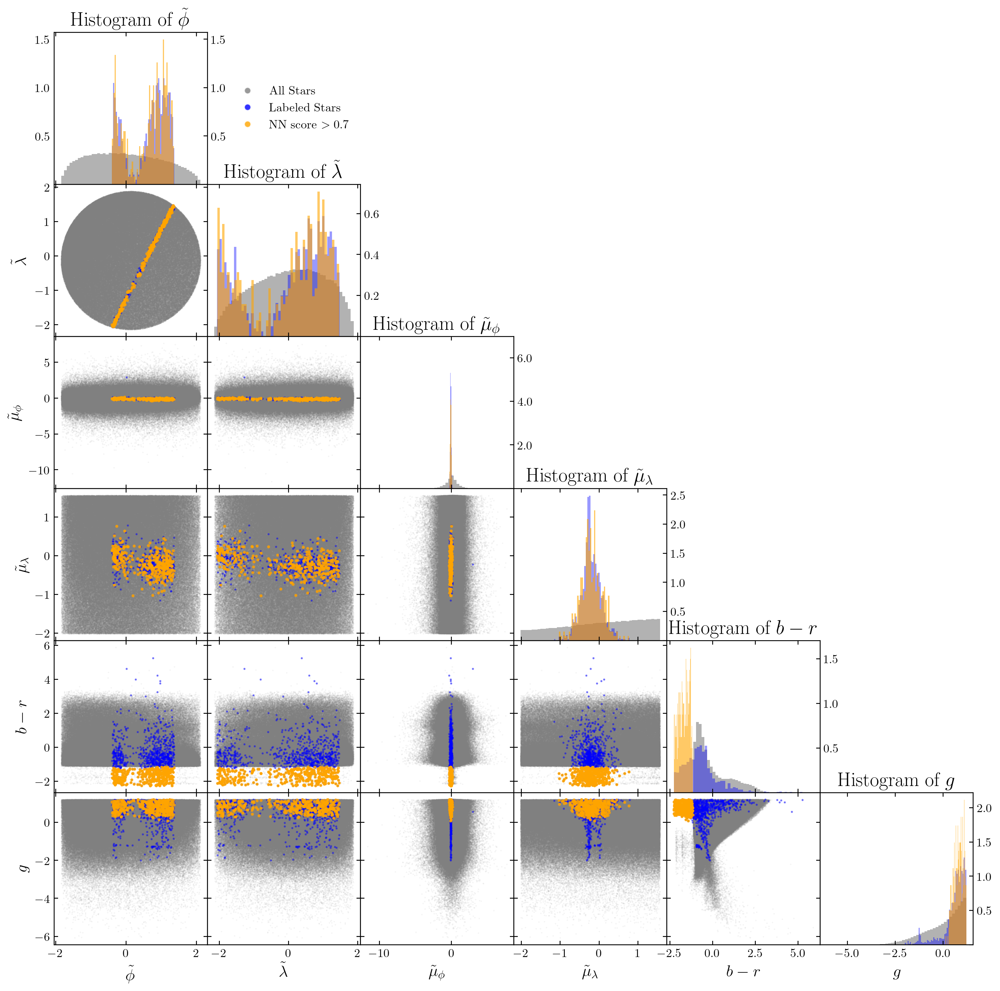

In [20]:
# Stadardaize data
scaler = StandardScaler()
standardized_design = scaler.fit_transform(class_df[interest_vars])
vars=[r'$\tilde{\phi}$', r'$\tilde{\lambda}$', r'$\tilde{\mu}_\phi$', r'$\tilde{\mu}_\lambda$', r'$b-r$', r'$g$']
corner_plots(standardized_design, vars, nn_score_inds, stream_inds)


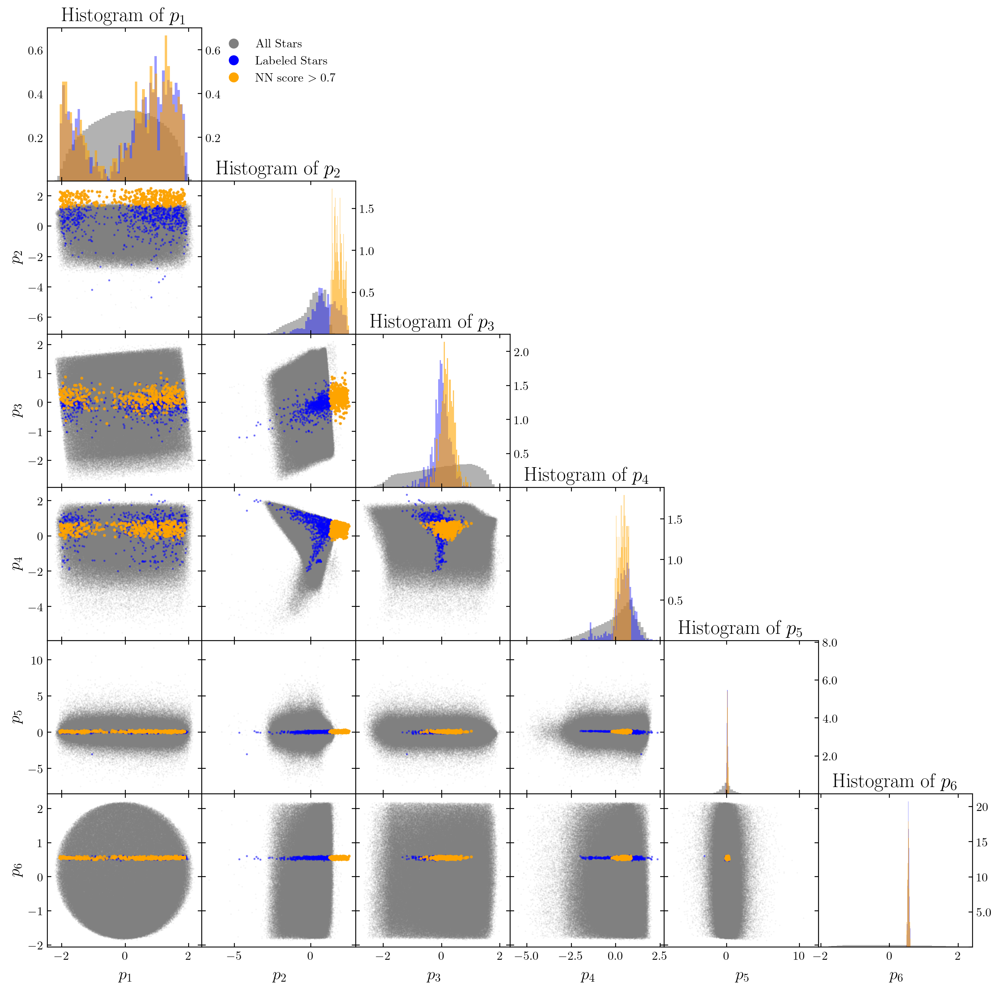

In [18]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]


vars=['$p_1$', '$p_2$', '$p_3$', '$p_4$', '$p_5$', '$p_6$']
corner_plots(standardized_design @ sorted_eigenvectors_nn, vars, nn_score_inds, stream_inds)



# Centering around the stream

### Simplified 2D example

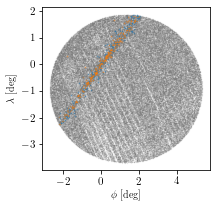

In [5]:
# Stadardaize data
scaler = StandardScaler()
scaler.fit_transform(class_df[intuitive_vars][nn_score_inds])
standardized_design = scaler.transform(class_df[intuitive_vars])

# Plot labeled vs ground truth
plt.figure(figsize=(3,3))
plt.scatter(*standardized_design.T,c='gray',alpha=0.2,s=0.03)
plt.scatter(*standardized_design[stream_inds].T,alpha=0.4,s=0.6)
plt.scatter(*standardized_design[nn_score_inds].T,alpha=0.4,s=0.6)
plt.xlabel('$\phi$ [deg]')
plt.ylabel('$\lambda$ [deg]')
plt.show()

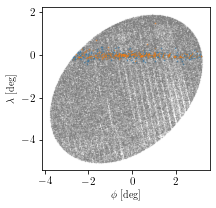

In [6]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]


plt.figure(figsize=(3,3))
plt.scatter(*sorted_eigenvectors_nn @ standardized_design.T,c='gray',alpha=0.2,s=0.03)
plt.scatter(*sorted_eigenvectors_nn @ standardized_design[stream_inds].T,alpha=0.4,s=0.6)
plt.scatter(*sorted_eigenvectors_nn @ standardized_design[nn_score_inds].T,alpha=0.4,s=0.6)
plt.xlabel('$\phi$ [deg]')
plt.ylabel('$\lambda$ [deg]')
plt.show()

### 3D Case

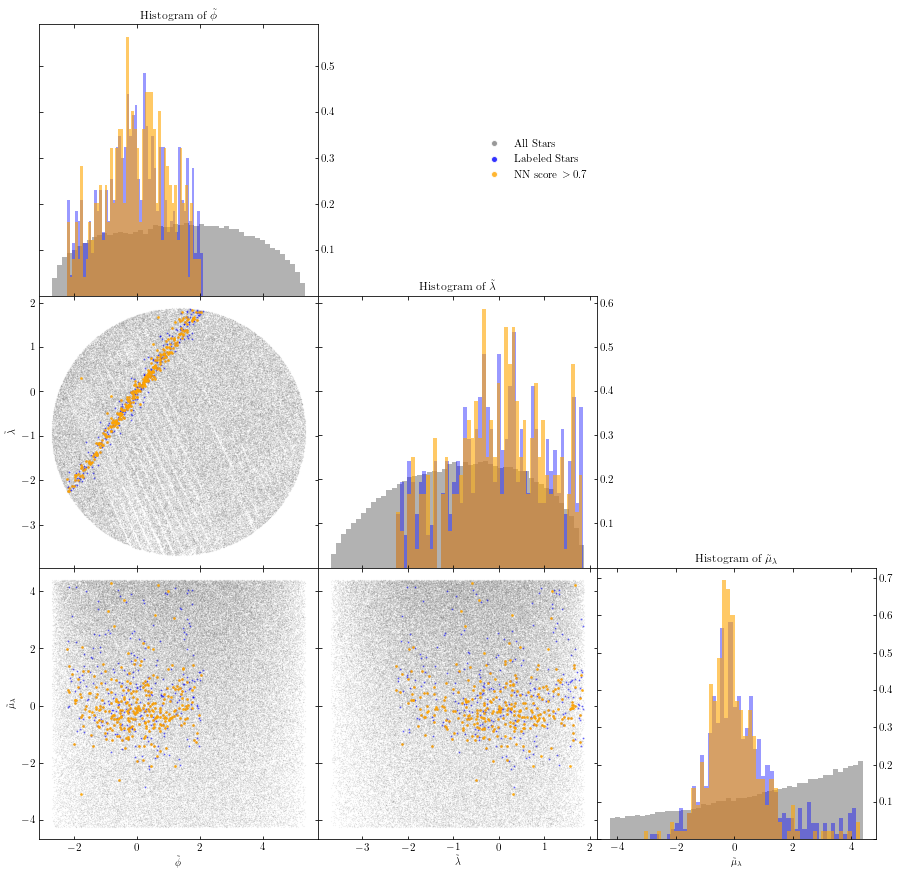

In [7]:
# Stadardaize data
scaler = StandardScaler()
scaler.fit_transform(class_df[toy_vars][nn_score_inds])
standardized_design = scaler.transform(class_df[toy_vars])

vars=[r'$\tilde{\phi}$', r'$\tilde{\lambda}$', r'$\tilde{\mu}_\lambda$']
corner_plots(standardized_design, vars, nn_score_inds, stream_inds)

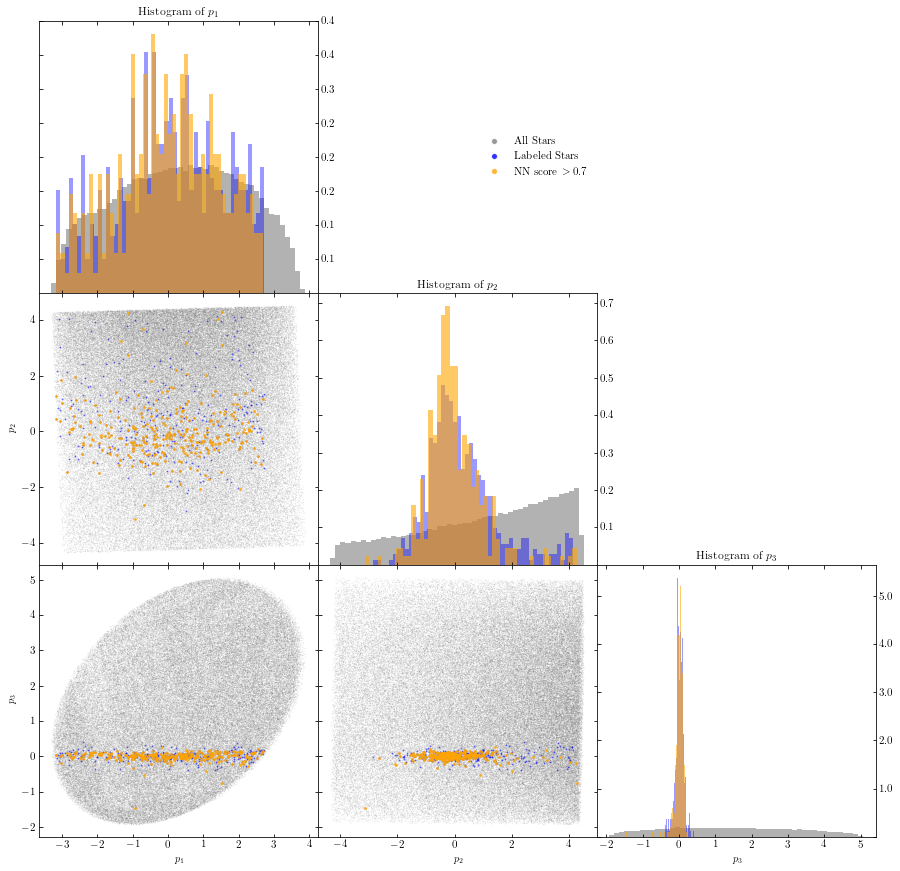

In [8]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]

vars=['$p_1$', '$p_2$', '$p_3$']
corner_plots(standardized_design @ sorted_eigenvectors_nn, vars, nn_score_inds, stream_inds)


### Full 6D

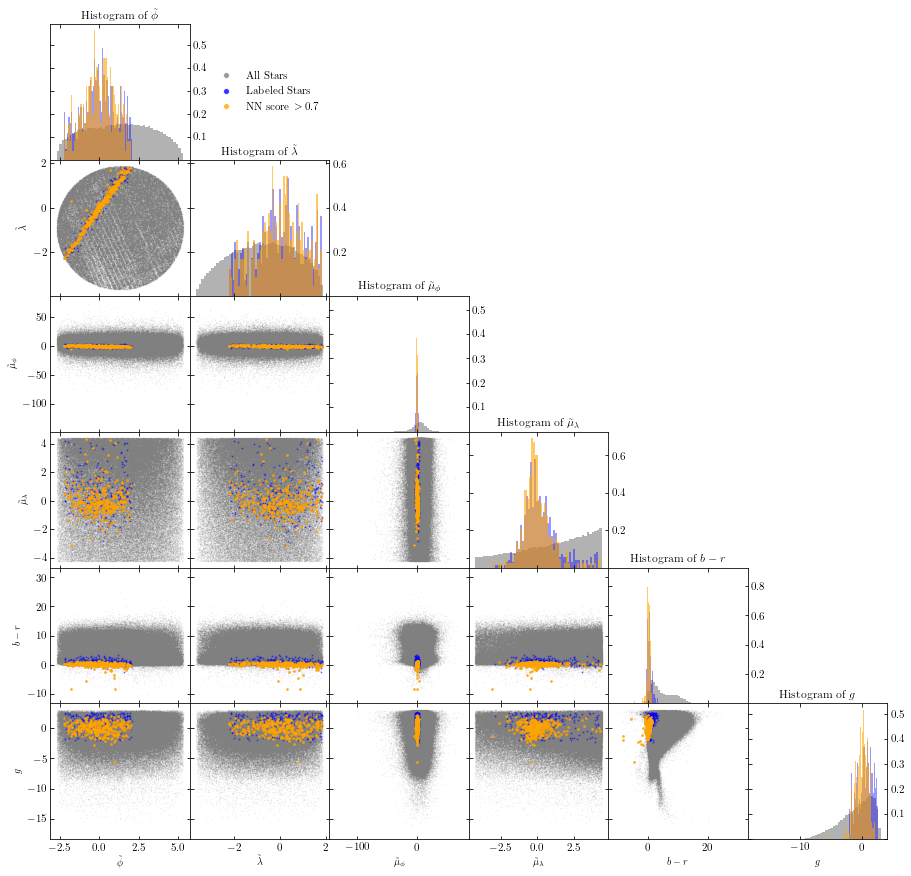

In [9]:
# Stadardaize data
scaler = StandardScaler()
scaler.fit(class_df[interest_vars][nn_score_inds])
standardized_design = scaler.transform(class_df[interest_vars])
vars=[r'$\tilde{\phi}$', r'$\tilde{\lambda}$', r'$\tilde{\mu}_\phi$', r'$\tilde{\mu}_\lambda$', r'$b-r$', r'$g$']
corner_plots(standardized_design, vars, nn_score_inds, stream_inds)


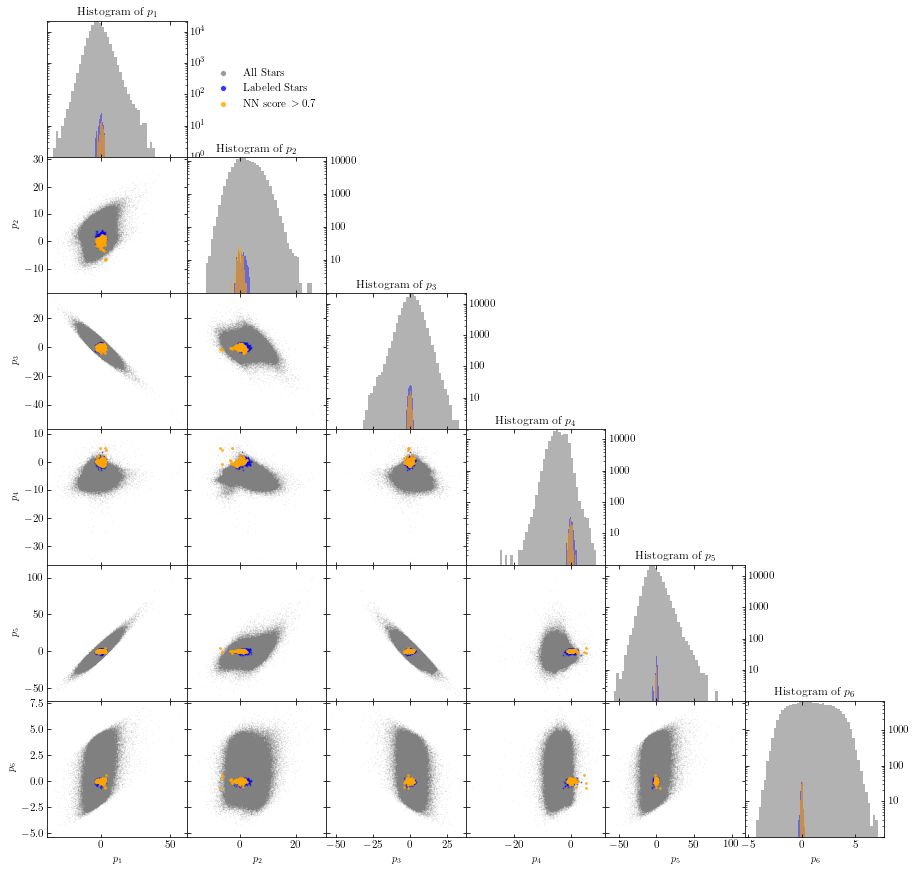

In [10]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]


vars=['$p_1$', '$p_2$', '$p_3$', '$p_4$', '$p_5$', '$p_6$']
corner_plots(standardized_design @ sorted_eigenvectors_nn, vars, nn_score_inds, stream_inds, density=False)



# Doing the analysis on a new parameter

In [11]:
# Original data
df = pd.read_hdf("../gaia_data/gd1_1_patch.h5")

Scanning over p6
Sideband region: [-0.6,-0.1) & (0.1,0.5]
Signal region: [-0.1,0.1]
Total counts: SR = 48,229, SB = 141,769
Signal region has 396 stream and 47,833 bkg events (0.83%).
Sideband region has 121 stream and 141,648 bkg events (0.09%).
f_sig = 9.7X f_sideband.


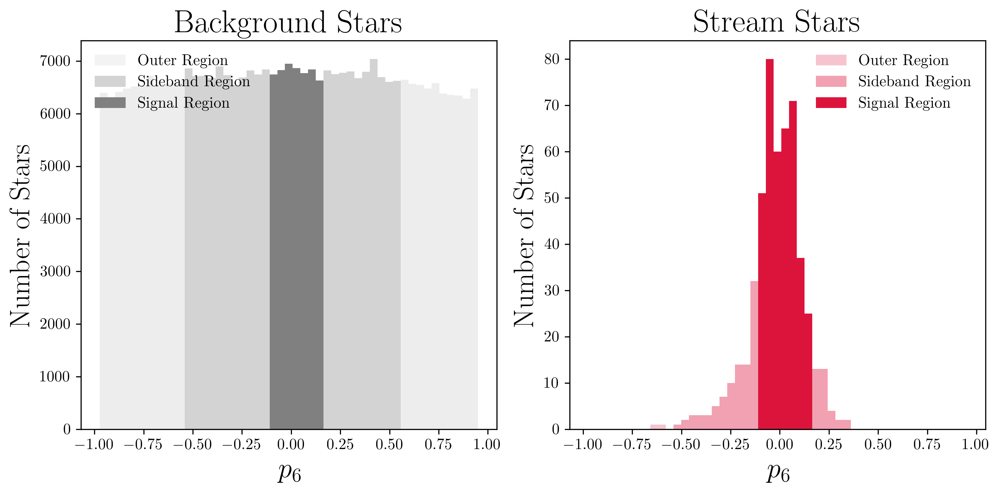

In [21]:
pc_vars = ['p1', 'p2', 'p3', 'p4', 'p5', 'p6']
df_rot=df.copy()
df_rot.drop(columns=interest_vars, inplace=True)

new_vars=scaler.transform(df[interest_vars] )
new_vars=new_vars @ sorted_eigenvectors_nn
new_vars_df = pd.DataFrame(new_vars, columns=pc_vars)

new_vars_df.columns=pc_vars
df_rot = pd.concat([df_rot, new_vars_df], axis=1)

### Divide into signal & sideband regions
processor = SignalSideband(df_rot,variable='p6', var_name='$p_6$',sr_factor=1, sb_factor=4,process=True)
df_slice = processor.df_slice
processor.plot_sb_data()

## Train

In [13]:
import tensorflow as tf
from tqdm import *
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "3" 
physical_devices = tf.config.list_physical_devices('GPU') 
tf.config.experimental.set_memory_growth(physical_devices[0], True)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))


Num GPUs Available:  1


In [14]:
save_folder = "new_vars"

if save_folder is not None: 
    os.makedirs(save_folder, exist_ok=True)

2023-09-05 15:33:10.604871: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1532] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43670 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:c1:00.0, compute capability: 8.6


1188/1188 [==============================] - 1s 1ms/step
Plotting results before fiducial cuts...
1188/1188 [==============================] - 1s 1ms/step
Plotting results before fiducial cuts...
1188/1188 [==============================] - 1s 799us/step
Plotting results before fiducial cuts...
1188/1188 [==============================] - 1s 798us/step
Plotting results before fiducial cuts...
1188/1188 [==============================] - 1s 1ms/step
Plotting results before fiducial cuts...


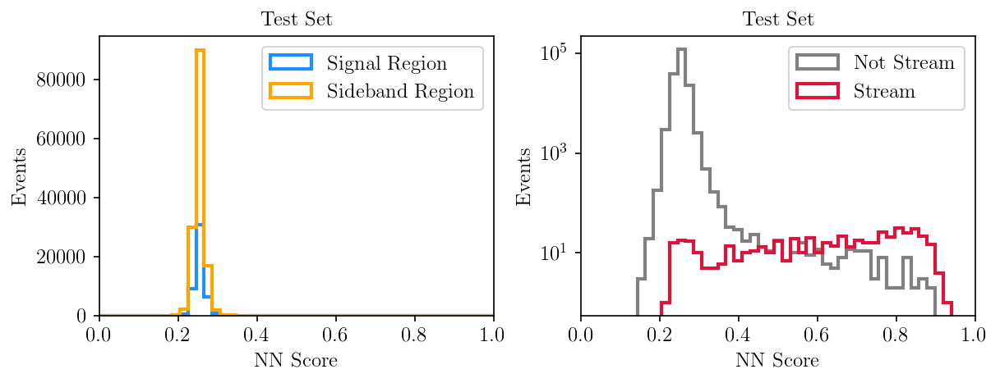

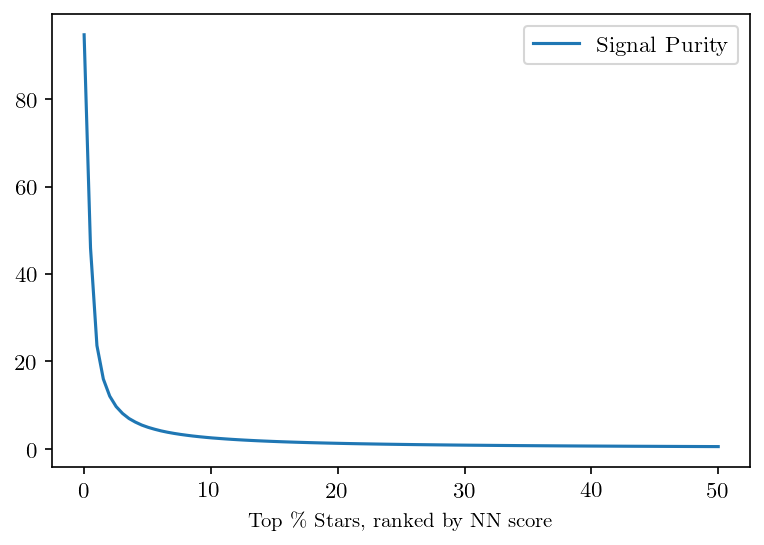

Top 50 stars: Purity = 90.0% 


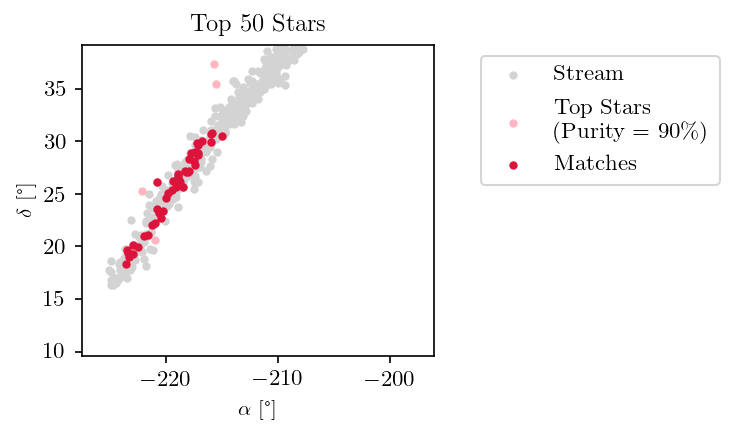

Top 100 stars: Purity = 88.0% 


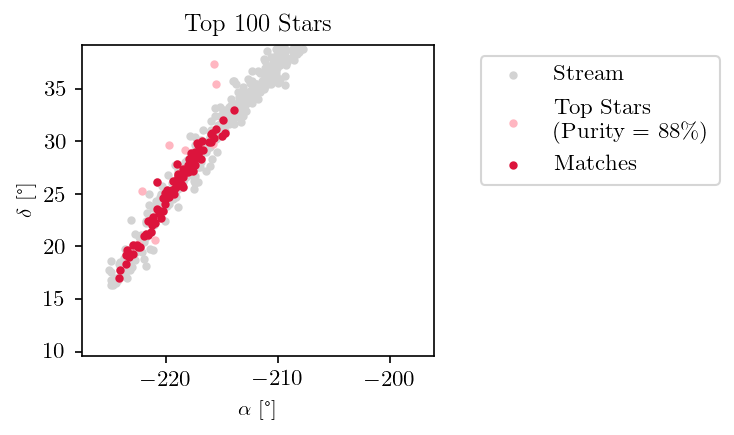

4.0 minutes and 34.43337631225586 seconds


In [22]:
import time
start_time=time.time()
tf.keras.backend.clear_session()
test = train(df_slice, verbose=False, apply_cuts = False, save_folder = save_folder)

dt=time.time()-start_time
mins=dt//60
secs=dt-60*mins
print(f'{mins} minutes and {secs} seconds')

In [23]:
298.2320556640625//60

4.0